# iWildCam 2021 - Starter Notebook
Original Link: https://www.kaggle.com/nayuts/iwildcam-2021-starter-notebook

# 1. Image File

In [1]:
import collections
from datetime import datetime as dt
import gc
import glob 
import json
import os
import warnings
warnings.filterwarnings('ignore')

import cv2
from imblearn.under_sampling import RandomUnderSampler
from IPython.display import YouTubeVideo
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image, ImageDraw
import seaborn as sns

%matplotlib inline

SEED = 2021

Check what images are available

In [2]:
TRAIN_DATA_PATH = './data/train/'
TEST_DATA_PATH = './data/test/'

train_jpeg = glob.glob(TRAIN_DATA_PATH + '*')
test_jpeg = glob.glob(TEST_DATA_PATH + '*')

print('number of train jpeg data:', len(train_jpeg))
print('number of test jpeg data:', len(test_jpeg))

number of train jpeg data: 203314
number of test jpeg data: 60214


Train Data

./data/train/8da8076c-21bc-11ea-a13a-137349068a90.jpg
./data/train/9507fa6c-21bc-11ea-a13a-137349068a90.jpg
./data/train/8c5d5f24-21bc-11ea-a13a-137349068a90.jpg
./data/train/895bd3c8-21bc-11ea-a13a-137349068a90.jpg
./data/train/8983b032-21bc-11ea-a13a-137349068a90.jpg
./data/train/869085bc-21bc-11ea-a13a-137349068a90.jpg
./data/train/968a0ace-21bc-11ea-a13a-137349068a90.jpg
./data/train/9638dc08-21bc-11ea-a13a-137349068a90.jpg
./data/train/8b8dca48-21bc-11ea-a13a-137349068a90.jpg
./data/train/8b5d698e-21bc-11ea-a13a-137349068a90.jpg
./data/train/92eff086-21bc-11ea-a13a-137349068a90.jpg
./data/train/88489a34-21bc-11ea-a13a-137349068a90.jpg
./data/train/95ad8ac2-21bc-11ea-a13a-137349068a90.jpg
./data/train/8830010e-21bc-11ea-a13a-137349068a90.jpg
./data/train/98ed67d4-21bc-11ea-a13a-137349068a90.jpg
./data/train/883b0338-21bc-11ea-a13a-137349068a90.jpg


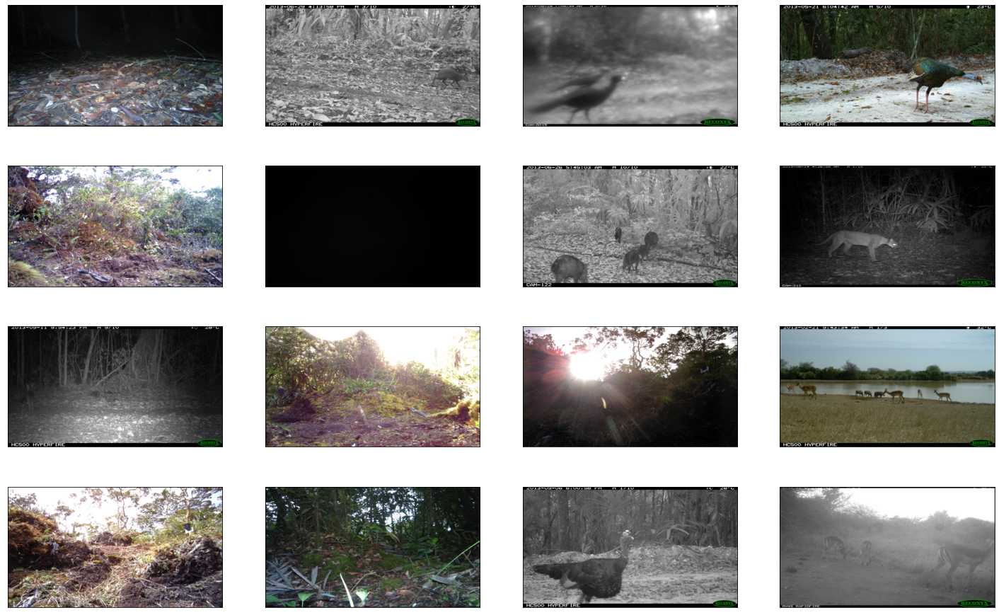

In [3]:
fig = plt.figure(figsize=(25,16))
for i,im_path in enumerate(train_jpeg[:16]): # lets see first 16 images
    print(im_path)
    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
    im = Image.open(im_path)
    im = im.resize((480,270))
    plt.imshow(im)

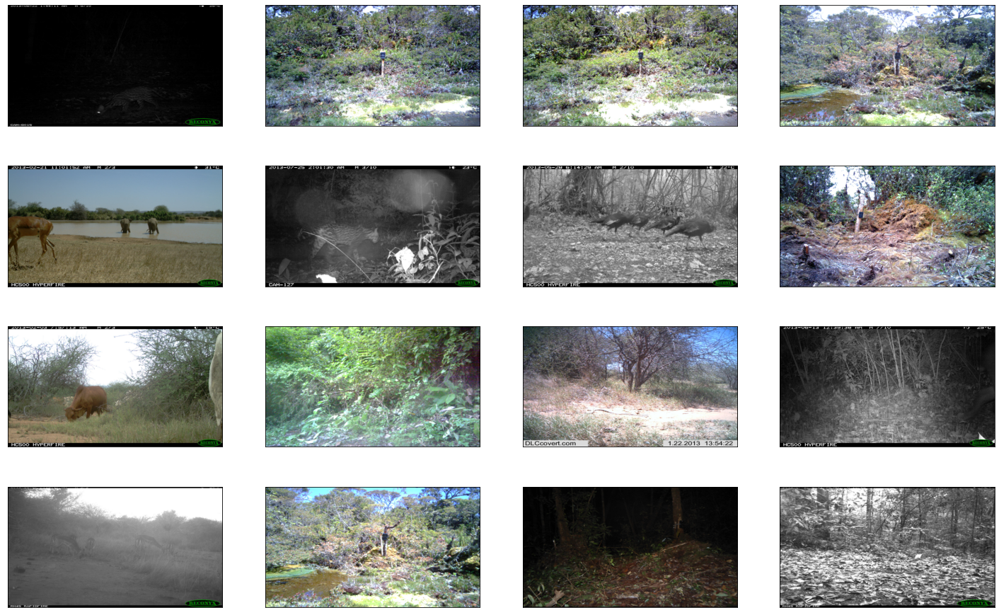

In [4]:
fig = plt.figure(figsize=(25, 16))
for i, im_path in enumerate(train_jpeg[16:32]):
    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[]) # divide figure to 4 * 4 grid
    im = Image.open(im_path)
    im = im.resize((480,270))
    plt.imshow(im)

Test Data


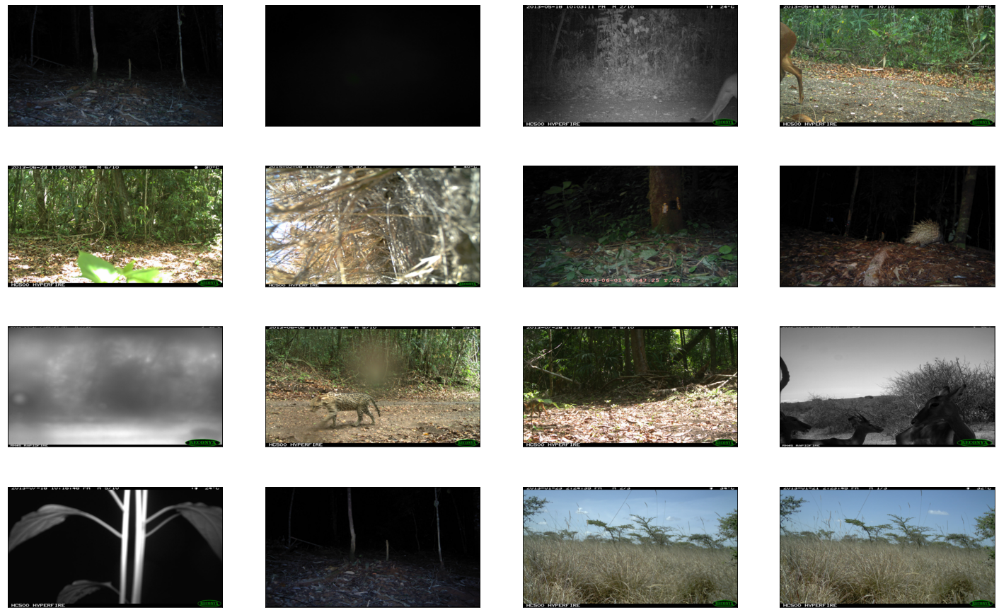

In [5]:
fig = plt.figure(figsize=(25, 16))
for i,im_path in enumerate(test_jpeg[:16]):
    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
    im = Image.open(im_path)
    im = im.resize((480,270))
    plt.imshow(im)

By camera traps, images are taken continuously because they are captured in bursts triggered by motion. Therefore, dataset also contains series of images, and in addition to IDs of image, IDs of the sequence are assigned.We will use IDs of image to load the image, on the other hands we will use IDs of sequence to submit.

Take a look at the submission file for details.

Additionally, we will notice that some of the images are in color and some are in black and white. This is due to the difference in whether the images were taken during the day or at night.

# 2. Submission File


Explanation for submission file
Explanation for submission file

In iWildcam 2021 - FGVC8 conpetition, we have to detect the number of each animal species in the image sequences. On the other hand, last year (in iWildcam 2020 - FGVC7) we identified which category of animal was being shown.

In [8]:
sub = pd.read_csv("./data/sample_submission.csv")
sub.head()

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted559,Predicted562,Predicted563,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571
0,32ce8026-7ec9-11eb-b675-4f3cc0c82eb3,4,2,8,3,6,6,6,3,6,...,6,4,1,0,9,5,5,1,5,8
1,945c6602-21bc-11ea-a13a-137349068a90,2,5,5,8,5,4,2,3,1,...,0,8,4,3,9,1,6,7,2,4
2,a91c7e26-0cd3-11eb-bed1-0242ac1c0002,0,0,3,5,8,3,5,4,6,...,2,3,9,6,3,7,9,2,6,5
3,9926239e-21bc-11ea-a13a-137349068a90,6,9,4,5,1,5,3,1,9,...,6,0,5,1,9,0,4,9,7,7
4,9672184c-21bc-11ea-a13a-137349068a90,4,1,5,8,8,4,1,7,1,...,2,4,3,2,0,6,5,3,9,3


Id columns represents id of sequence as we see in Checking iwildcam2021_train_annotations.json. PredictedX columns are number of individuals of species in sequence. There are 111057 sequences in test dataset, and 205 species in given dataset.

In [9]:
sub.shape

(11057, 205)

# 3. Metadata File

Checking iwildcam2021_train_annotations.json
We are provided annotation data for train data as "iwildcam2021_train_annotations.json". This json follows COCO-CameraTraps format with additional field.

If we load the json, we can find there are three key-values in it.

In [10]:
with open('./data/metadata/iwildcam2021_train_annotations.json', encoding='utf-8') as json_file:
    train_annotations = json.load(json_file)

train_annotations.keys()

dict_keys(['images', 'annotations', 'categories'])

In images value, we can get data for each wildcan images. Wildcam will take several frames in a row. The value of 'seq_num_frames' key is the number of frames, 'id' is the id of the image, and 'seq_id' is the ID associated with the sequentially shot image. This 'seq_id' is the same as the 'Id' in the submission file.

Let's extract the data corresponding to shot of seq_id:302ad820-7d42-11eb-8fb5-0242ac1c0002.

**seq_id is label for sequence of images, id is label for single image!**

In [11]:
train_annotations_seq = train_annotations["images"][94:104]
train_annotations_seq

[{'seq_num_frames': 10,
  'location': 501,
  'datetime': '2013-02-19 11:28:27.000',
  'id': '8f600c80-21bc-11ea-a13a-137349068a90',
  'seq_id': '302ad820-7d42-11eb-8fb5-0242ac1c0002',
  'width': 1920,
  'height': 1080,
  'file_name': '8f600c80-21bc-11ea-a13a-137349068a90.jpg',
  'seq_frame_num': 0},
 {'seq_num_frames': 10,
  'location': 501,
  'datetime': '2013-02-19 11:28:27.000',
  'id': '92369294-21bc-11ea-a13a-137349068a90',
  'seq_id': '302ad820-7d42-11eb-8fb5-0242ac1c0002',
  'width': 1920,
  'height': 1080,
  'file_name': '92369294-21bc-11ea-a13a-137349068a90.jpg',
  'seq_frame_num': 1},
 {'seq_num_frames': 10,
  'location': 501,
  'datetime': '2013-02-19 11:28:28.000',
  'id': '970498c0-21bc-11ea-a13a-137349068a90',
  'seq_id': '302ad820-7d42-11eb-8fb5-0242ac1c0002',
  'width': 1920,
  'height': 1080,
  'file_name': '970498c0-21bc-11ea-a13a-137349068a90.jpg',
  'seq_frame_num': 2},
 {'seq_num_frames': 10,
  'location': 501,
  'datetime': '2013-02-19 11:28:28.000',
  'id': '8969

If we see the images, we can find that they are a series of images.

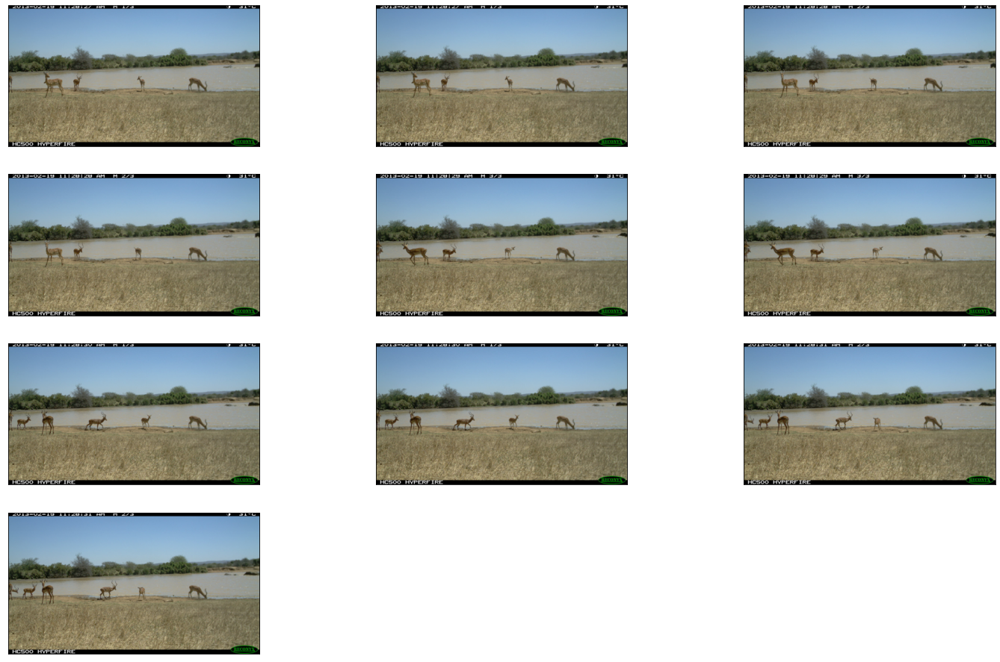

In [12]:
train_images_seq = [(TRAIN_DATA_PATH + item["id"] + '.jpg') for item in train_annotations_seq] # use id from json
img_array = []
size = (480,270)

fig = plt.figure(figsize = (25,16))
for i, im_path in enumerate(train_images_seq):
    ax = fig.add_subplot(4, 3, i+1, xticks=[], yticks=[])
    im = Image.open(im_path)
    im = im.resize(size)
    plt.imshow(im)

    img_array.append(im)

The value of the categories key contains a list of annotated animal species. id 0 is empty. The id is up to 571, but there are 204 annotated species. So we have to classify for 204 species + empty at most (not 571 + empty)

In [13]:
df_categories = pd.DataFrame.from_records(train_annotations["categories"])
df_categories

,id,name
0,0,empty
1,2,tayassu pecari
2,3,dasyprocta punctata
3,4,cuniculus paca
4,6,puma concolor
...,...,...
200,566,sciurus sp
201,567,ave desconocida
202,568,aramides cajanea
203,570,aramus guarauna


In [17]:
df_categories.loc[97]

id                    242
name    tamandua mexicana
Name: 97, dtype: object

Each training image has at leat one associated annotation. The annotated category_ids are in value of "annotations" key.

In [24]:
train_annotations["annotations"][:10]

[{'id': 'a292dd3c-21bc-11ea-a13a-137349068a90',
  'image_id': '96b00332-21bc-11ea-a13a-137349068a90',
  'category_id': 73},
 {'id': 'a0afcfc0-21bc-11ea-a13a-137349068a90',
  'image_id': '879d74d8-21bc-11ea-a13a-137349068a90',
  'category_id': 4},
 {'id': 'a306e9c0-21bc-11ea-a13a-137349068a90',
  'image_id': '9017f7aa-21bc-11ea-a13a-137349068a90',
  'category_id': 227},
 {'id': '9eed94c4-21bc-11ea-a13a-137349068a90',
  'image_id': '90d93c58-21bc-11ea-a13a-137349068a90',
  'category_id': 250},
 {'id': 'a2a4dd7a-21bc-11ea-a13a-137349068a90',
  'image_id': '887cd0ec-21bc-11ea-a13a-137349068a90',
  'category_id': 2},
 {'id': '9f159262-21bc-11ea-a13a-137349068a90',
  'image_id': '9137d902-21bc-11ea-a13a-137349068a90',
  'category_id': 233},
 {'id': 'a1b98046-21bc-11ea-a13a-137349068a90',
  'image_id': '9784a768-21bc-11ea-a13a-137349068a90',
  'category_id': 230},
 {'id': '9c3ec4aa-21bc-11ea-a13a-137349068a90',
  'image_id': '8a3643d2-21bc-11ea-a13a-137349068a90',
  'category_id': 233},
 {'id

There seems to be data in train data for all annotated categories

In [26]:
train_annotated_category = set([annotation["category_id"] for annotation in train_annotations['annotations']])
len(train_annotated_category)

205

# 4. Checking iwildcam2021_test_information.json
Information for test dataset. The format is similar to iwildcam2021_train_annotations.json with only images key

In [27]:
with open ("./data/metadata/iwildcam2021_test_information.json", encoding="utf-8") as json_file:
    test_information = json.load(json_file)

test_information.keys()

dict_keys(['images'])

In [29]:
test_information['images'][:5]

[{'height': 1024,
  'id': '8b31d3be-21bc-11ea-a13a-137349068a90',
  'seq_id': 'a91ebc18-0cd3-11eb-bed1-0242ac1c0002',
  'location': 20,
  'width': 1280,
  'datetime': '2013-06-09 16:01:38.000',
  'file_name': '8b31d3be-21bc-11ea-a13a-137349068a90.jpg',
  'seq_frame_num': 0,
  'seq_num_frames': 10},
 {'height': 1024,
  'id': '8cf202be-21bc-11ea-a13a-137349068a90',
  'seq_id': 'a91ebc18-0cd3-11eb-bed1-0242ac1c0002',
  'location': 20,
  'width': 1280,
  'datetime': '2013-06-09 16:01:39.000',
  'file_name': '8cf202be-21bc-11ea-a13a-137349068a90.jpg',
  'seq_frame_num': 1,
  'seq_num_frames': 10},
 {'height': 1024,
  'id': '8a87e62e-21bc-11ea-a13a-137349068a90',
  'seq_id': 'a91ebc18-0cd3-11eb-bed1-0242ac1c0002',
  'location': 20,
  'width': 1280,
  'datetime': '2013-06-09 16:01:40.000',
  'file_name': '8a87e62e-21bc-11ea-a13a-137349068a90.jpg',
  'seq_frame_num': 2,
  'seq_num_frames': 10},
 {'height': 1024,
  'id': '8e6994f4-21bc-11ea-a13a-137349068a90',
  'seq_id': 'a91ebc18-0cd3-11eb-be

# Checking iwildcam2021_megadetector_results.json
We can also use [Microsoft AI for Earch MegaDetector](https://github.com/microsoft/CameraTraps/blob/master/megadetector.md). This model is trained to detect animals, people, and vehicles in camera trap images using hundreds of thousands of bounding boxes from various ecosystems. The model does not identify animals, it ** only finds them**

We are provided with some sample detection results as  
"iwildcam2021_megadetector_results.json".

In [30]:
with open('./data/metadata/iwildcam2021_megadetector_results.json', encoding='utf-8') as json_file:
    megadetector_results = json.load(json_file)

megadetector_results.keys()

dict_keys(['info', 'images', 'detection_categories'])

There are three key-value data in json  
Detected result is in images value.

In [31]:
megadetector_results_df = pd.DataFrame(megadetector_results["images"])
megadetector_results_df.head()

,detections,id,max_detection_conf
0,"[{'category': '1', 'bbox': [0.6529, 0.5425, 0....",905a3c8c-21bc-11ea-a13a-137349068a90,0.999
1,"[{'category': '1', 'bbox': [0.0147, 0.0, 0.985...",905a3fc0-21bc-11ea-a13a-137349068a90,0.696
2,[],905a420e-21bc-11ea-a13a-137349068a90,0.000
3,"[{'category': '1', 'bbox': [0.0, 0.4669, 0.185...",905a4416-21bc-11ea-a13a-137349068a90,1.000
4,"[{'category': '1', 'bbox': [0.0, 0.0494, 0.528...",905a579e-21bc-11ea-a13a-137349068a90,0.999


Since there are 263504 detection data, it seems that all the data from train data and test data have been processed. So we do not need to run MegaDetector ourselves. If you want to finetune with the MegaDetector's weights or redo the estimation yourself, please refer to this [notebook](https://www.kaggle.com/nayuts/try-megadetector-crop-animals-on-kaggle-notebook)

In [32]:
print(f"There aer {len(megadetector_results_df)} detection data.")

There aer 263504 detection data.


Especially, detected bbox is in detections value.

In [33]:
megadetector_results_df.iloc[100]["detections"]

[{'category': '1', 'bbox': [0.2679, 0.5933, 0.5148, 0.3569], 'conf': 1.0}]

We can see the result like this

In [34]:
#Refered: https://www.kaggle.com/qinhui1999/how-to-use-bbox-for-iwildcam-2020 

def draw_bboxs(detections_list, im):
    """
    detections_list: list of set includes bbox.
    im: image read by Pillow.
    """
    
    for detection in detections_list:
        x1, y1,w_box, h_box = detection["bbox"]
        ymin,xmin,ymax, xmax=y1, x1, y1 + h_box, x1 + w_box
        draw = ImageDraw.Draw(im)
        
        imageWidth=im.size[0]
        imageHeight= im.size[1]
        (left, right, top, bottom) = (xmin * imageWidth, xmax * imageWidth,
                                      ymin * imageHeight, ymax * imageHeight)
        
        draw.line([(left, top), (left, bottom), (right, bottom),
               (right, top), (left, top)], width=4, fill='Red')

Text(0.5, 1.0, 'image 100 with bbox')

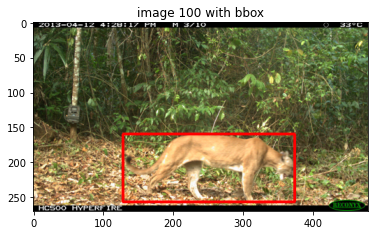

In [36]:
# Let's see 100th data of train dataset.
data_index = 100

# Load 100th image data. 
im = Image.open("./data/train/" + megadetector_results_df.loc[data_index]['id'] + ".jpg")
im = im.resize((480,270))

# Overwrite bbox
draw_bboxs(megadetector_results_df.loc[data_index]['detections'], im)

# Show
plt.imshow(im)
plt.title(f"image {data_index} with bbox")

In [37]:
megadetector_results_df.iloc[data_index]['detections'][0]['bbox']

[0.2679, 0.5933, 0.5148, 0.3569]

It is also possible to crop the detected area like this. If you save the image, you can create dataset

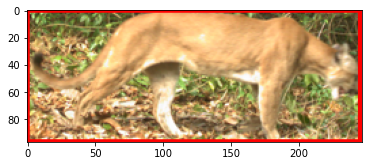

In [38]:
def get_crop_area(bbox, image_size):
    x1, y1,w_box, h_box = bbox
    ymin,xmin,ymax, xmax = y1, x1, y1 + h_box, x1 + w_box
    area = (xmin * image_size[0], ymin * image_size[1], 
            xmax * image_size[0], ymax * image_size[1])
    return area

crop_area = get_crop_area(megadetector_results_df.loc[data_index]['detections'][0]["bbox"], im.size)
im_croped = im.crop(crop_area)
plt.imshow(im_croped)

In [39]:
megadetector_results['info']

{'format_version': '1.0',
 'detector': 'megadetector_v3',
 'detection_completion_time': '2020-01-10 08:49:05'}

In [40]:
megadetector_results['detection_categories']

{'2': 'person', '1': 'animal'}

There is a dataset that crop the detection area of MegaDetector. It is in this [sparate notebook](https://www.kaggle.com/nayuts/256-x-256-cropped-images)

# Exploratory data analysis
Check distribution od data in mainly three insights
- Category ID
- Time point
- Location

As far as the following EDA results are concerned, the given dataset seems to be the same as last year. [notes from last year](https://www.kaggle.com/nayuts/iwildcam-2020-overviewing-for-start). To a greater or lesser extent, we can use the findings of last years competition

## How many data are there per animal category ID?
There are a lot of categories in dataset. To confirm how many data are there in each categories, barplot is used.

In [42]:
# Preperation for isualization
df_categories = pd.DataFrame(train_annotations["categories"])
labels_id = [item["id"] for item in train_annotations["categories"]]
cnt = collections.Counter([item["category_id"] for item in train_annotations["annotations"]])
df_categories_count = pd.DataFrame.from_dict(cnt, orient='index').reset_index()
df_categories_count = df_categories_count.rename(columns={'index':'id', 0:'count'})

df_categories_count = df_categories_count.merge(df_categories, on='id').sort_values(by=['count'], ascending=False)

Text(0.5, 1.0, 'distribution of count per id in train')

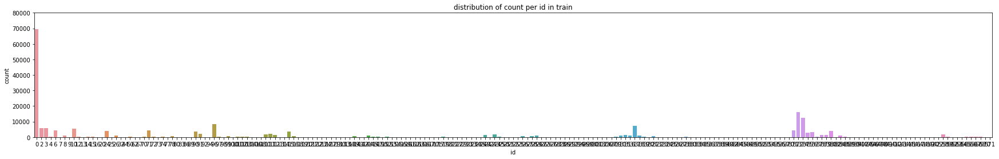

In [43]:
fig = plt.figure(figsize=(30, 4))
ax = sns.barplot(x="id", y="count",data=df_categories_count, order=labels_id)
ax.set(ylabel='count')
ax.set(ylim=(0,80000))
plt.title('distribution of count per id in train')

Since there are many categories, an interactive bar chart is shown for details

In [48]:
import plotly.express as px
fig = px.bar(df_categories_count, x="id", y="count", 
             title='distribution of count per id in train',
             width=800, height=400, color='id')
fig.show()

The annotation data seems to be biased to some extent. To see the breakdown, let's look at the top 10 categories.

Empty is the most, but annotations stating that animals are in the picture also seem to vary among the top 10.

In [49]:
df_categories_count.iloc[:10]

,id,count,name
53,0,69487,empty
112,372,16282,meleagris ocellata
176,374,12408,crax rubra
67,96,8440,aepyceros melampus
25,317,7414,cephalophus nigrifrons
4,2,5770,tayassu pecari
180,3,5753,dasyprocta punctata
11,10,5611,leopardus pardalis
181,371,4422,urocyon cinereoargenteus
60,71,4353,bos taurus


On the other hand, fewer categories have only about one sample. We need to be careful when splitting the dataset to train and validation data when training the model.

In [50]:
df_categories_count.iloc[-10:]

,id,count,name
15,229,1,nothocrax urumutum
21,252,1,paleosuchus sp
19,251,1,phaetornis sp
158,417,1,myiophoneus caeruleus
22,253,1,brotogeris sp
149,306,1,polyplectron chalcurum
161,420,1,callosciurus notatus
92,114,1,chlorocebus pygerythrus
167,296,1,varanus salvator
134,408,1,leiothrix argentauris


Let's look at the cumulative ratio. If we take the cumulative sum in order of increasing number, we can see that the 40th category reaches 95% and the 90th category reaches 99%.

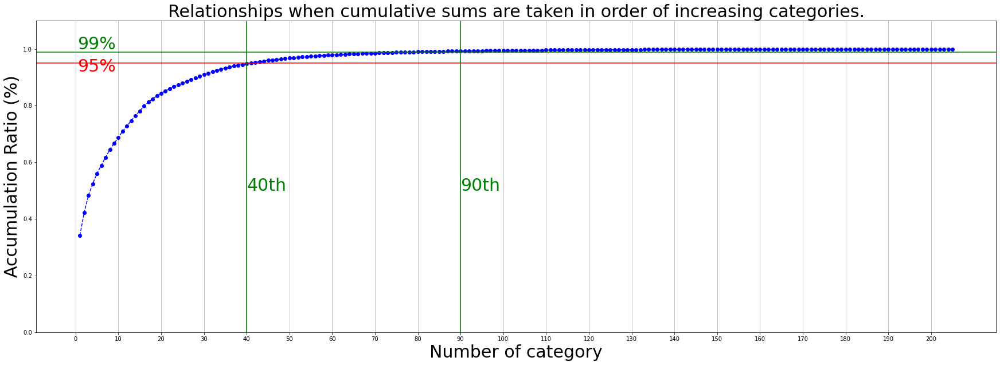

In [51]:
# Refered https://www.kaggle.com/kushal1506/deciding-n-components-in-pca

fig, ax = plt.subplots(figsize=(30, 10))
xi = np.arange(1, len(df_categories_count)+1, step=1)

plt.ylim(0.0,1.1)
plt.plot(xi, df_categories_count["count"].cumsum()/sum(df_categories_count["count"]), marker='o', linestyle='--', color='b')


plt.xlabel('Number of category', fontsize=30)
plt.xticks(np.arange(0, len(df_categories_count), step=10)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Accumulation Ratio (%)', fontsize=30)
plt.title('Relationships when cumulative sums are taken in order of increasing categories.', fontsize=30)

plt.axhline(y=0.99, color='g', linestyle='-')
plt.text(0.5, 1.00, '99%', color = 'green', fontsize=30)

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.92, '95%', color = 'red', fontsize=30)

plt.axvline(x=40, color='g', linestyle='-')
plt.text(40, 0.5, '40th', color = 'green', fontsize=30)
         
plt.axvline(x=90, color='g', linestyle='-')
plt.text(90, 0.5, '90th', color = 'green', fontsize=30)

ax.grid(axis='x')
plt.show()

Using such imbalanced data makes it hard to train models. For a quick solution, using [RandomUnderSampler](https://imbalanced-learn.org/stable/under_sampling.html#controlled-under-sampling-techniques) of [imblearn](https://imbalanced-learn.org/stable/) can help

In [52]:
# Convert annotation data to pandas DataFrame
df_train_annotations = pd.DataFrame(train_annotations["annotations"])

# Under sampling
rus = RandomUnderSampler(random_state=SEED, replacement=True)
df_train_annotations_resampled, _ = rus.fit_resample(df_train_annotations, df_train_annotations["category_id"])

In [53]:
df_train_annotations_resampled.reset_index(drop=True)

,id,image_id,category_id
0,a10c0da8-21bc-11ea-a13a-137349068a90,90b80970-21bc-11ea-a13a-137349068a90,0
1,9d97cc0c-21bc-11ea-a13a-137349068a90,98b751d0-21bc-11ea-a13a-137349068a90,2
2,9d006128-21bc-11ea-a13a-137349068a90,980cde4e-21bc-11ea-a13a-137349068a90,3
3,a064595a-21bc-11ea-a13a-137349068a90,879a1d88-21bc-11ea-a13a-137349068a90,4
4,9de71b22-21bc-11ea-a13a-137349068a90,8d9db1cc-21bc-11ea-a13a-137349068a90,6
...,...,...,...
200,9eaaa9ca-21bc-11ea-a13a-137349068a90,911a97c0-21bc-11ea-a13a-137349068a90,566
201,9f3ebfa2-21bc-11ea-a13a-137349068a90,98964d3c-21bc-11ea-a13a-137349068a90,567
202,9cd96488-21bc-11ea-a13a-137349068a90,8a6a6338-21bc-11ea-a13a-137349068a90,568
203,a29c2b08-21bc-11ea-a13a-137349068a90,8fc7c0be-21bc-11ea-a13a-137349068a90,570


## When was this photo taken?
Because animals can change their activity from time to time, we want to understand how data is distributed over time.

In [54]:
df_images = pd.DataFrame(train_annotations["images"])
df_images_test = pd.DataFrame(test_information["images"])

In [55]:
month_year = df_images['datetime'].map(lambda str: str[2:7])
labels_month_year = sorted(list(set(month_year)))

month_year_test = df_images_test['datetime'].map(lambda str: str[2:7])

### Year and Month Perspective

[(0.0, 50000.0)]

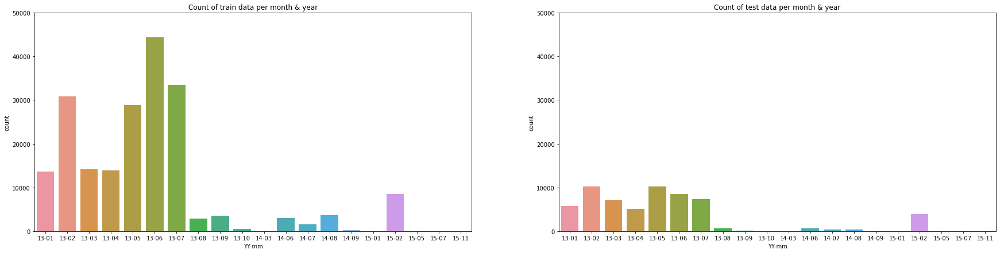

In [57]:
fig, ax = plt.subplots(1,2, figsize=(30,7))
ax = plt.subplot(1,2,1)
ax = plt.title('Count of train data per month & year')
ax = sns.countplot(month_year, order=labels_month_year)
ax.set(xlabel='YY-mm', ylabel='count')
ax.set(ylim=(0,50000))

ax = plt.subplot(1,2,2)
ax = plt.title('Count of test data per month & year')

ax = sns.countplot(month_year_test, order=labels_month_year)
ax.set(xlabel='YY-mm', ylabel='count')
ax.set(ylim=(0,50000))

Data starts 2013-01 but there seems be some lacks. For example, train data between 2013-11 to 2014-02 are missing.

Also we can find that train data in between 2013-01 to 2013-07 are rich than other time point.

Train data covers test data in perspective of time point.

### Monthly perspective

[(0.0, 55000.0)]

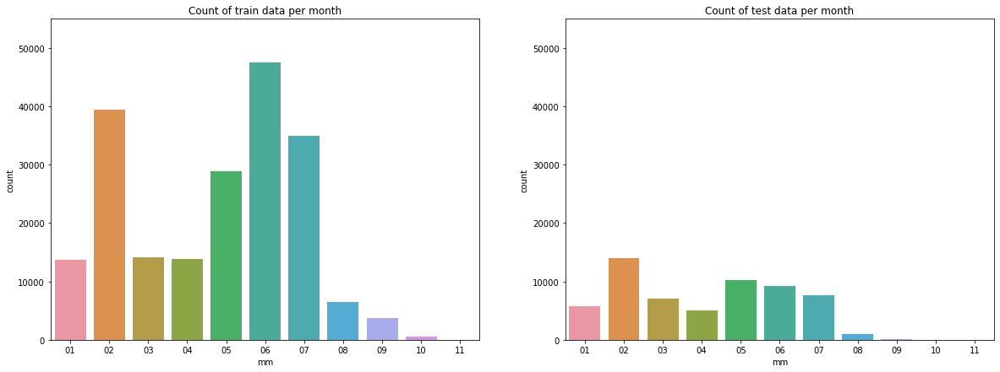

In [58]:
labels_month = sorted(list(set(df_images['datetime'].map(lambda str: str[5:7]))))

fig, ax = plt.subplots(1,2, figsize=(20,7))
ax = plt.subplot(1,2,1)
plt.title('Count of train data per month')
ax = sns.countplot(df_images['datetime'].map(lambda str: str[5:7] ), order=labels_month)
ax.set(xlabel='mm', ylabel='count')
ax.set(ylim=(0,55000))

ax = plt.subplot(1,2,2)
plt.title('Count of test data per month')
ax = sns.countplot(df_images_test['datetime'].map(lambda str: str[5:7] ), order=labels_month)
ax.set(xlabel='mm', ylabel='count')
ax.set(ylim=(0,55000))

Train data are bias. In February, March, June and July, data are rich than other months.

Train data covers test data in perspective of month.

Data for November and December are missing. Do animals hibernate?

### Hourly perspectives

[(0.0, 20000.0)]

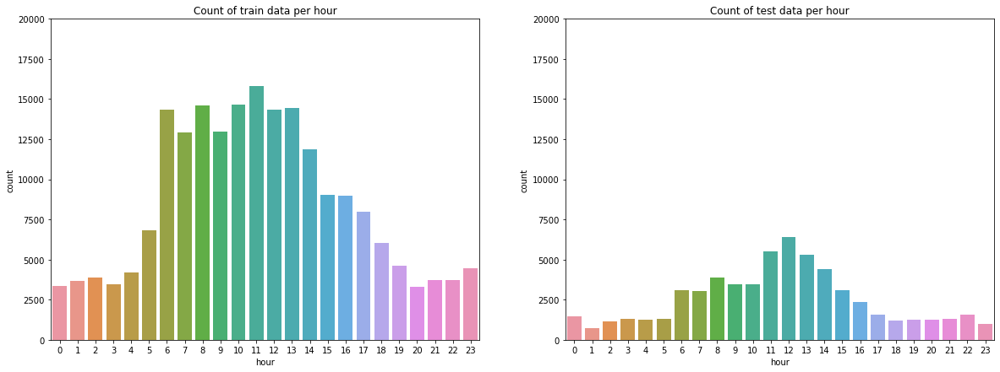

In [60]:
train_taken_hour = df_images['datetime'].map(lambda x: dt.strptime(x, '%Y-%m-%d %H:%M:%S.%f').hour)
test_taken_hour = df_images_test['datetime'].map(lambda x: dt.strptime(x, '%Y-%m-%d %H:%M:%S.%f').hour)

fig, ax = plt.subplots(1,2, figsize=(20,7))
ax = plt.subplot(1,2,1)
plt.title('Count of train data per hour')
ax = sns.countplot(train_taken_hour)
ax.set(xlabel='hour', ylabel='count')
ax.set(ylim=(0,20000))

ax = plt.subplot(1,2,2)
plt.title('Count of test data per hour')
ax = sns.countplot(test_taken_hour)
ax.set(xlabel='hour', ylabel='count')
ax.set(ylim=(0,20000))

If we decide arbitrarily during daytime and at night, we can also calculate diurnal and nocturnal data counts.

For example, we define "during daytime" is "6-17 O'clock" and "at night" is "18-5 O'clock",

### Day and night perspective

In [61]:
train_taken_phase = train_taken_hour.map(lambda x: "daytime" if x >= 6 and x < 18 else "night")
test_taken_phase = test_taken_hour.map(lambda x: "daytime" if x >= 6 and x < 18 else "night")

[(0.0, 200000.0)]

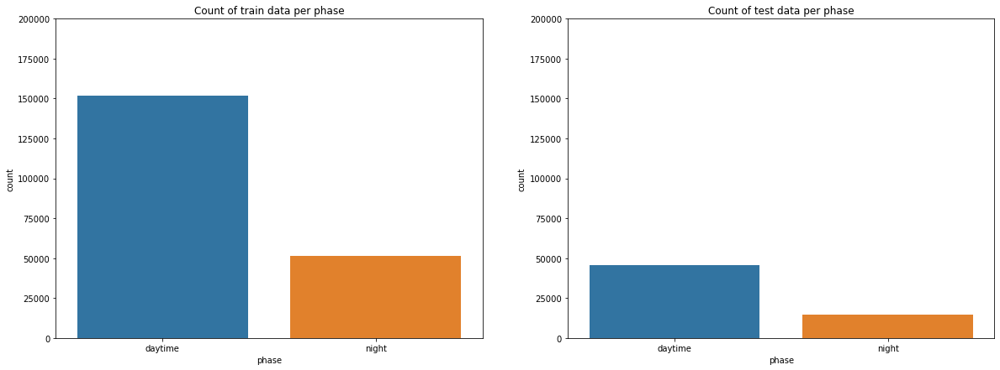

In [62]:
fig, ax = plt.subplots(1,2, figsize=(20,7))
ax = plt.subplot(1,2,1)
plt.title('Count of train data per phase')
ax = sns.countplot(train_taken_phase, order=["daytime", "night"])
ax.set(xlabel='phase', ylabel='count')
ax.set(ylim=(0,200000))

ax = plt.subplot(1,2,2)
plt.title('Count of test data per phase')
ax = sns.countplot(test_taken_phase, order=["daytime", "night"])
ax.set(xlabel='phase', ylabel='count')
ax.set(ylim=(0,200000))

When we looked at given image files at the beginning of this notebook, we saw mixture of color and black and white images. Using the time of day feature, we may be able to successfully distinguish whether they are in color or not.

## Where was this photo taken?
We are required to detect photos taken at different locations, but how are data distributed w.r.t. location?

Text(0.5, 1.0, 'Count of train data per location')

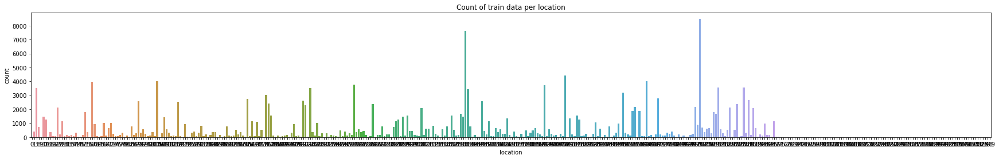

In [63]:
labels_location_train = sorted(list(set(df_images['location'])))
labels_location_test = sorted(list(set(df_images_test['location'])))
labels_location = labels_location_train + labels_location_test

fig = plt.figure(figsize=(30, 4))
ax = sns.countplot(df_images['location'], order=labels_location)
ax.set(xlabel='location', ylabel='count')
plt.title('Count of train data per location')

Text(0.5, 1.0, 'Count of test data per location')

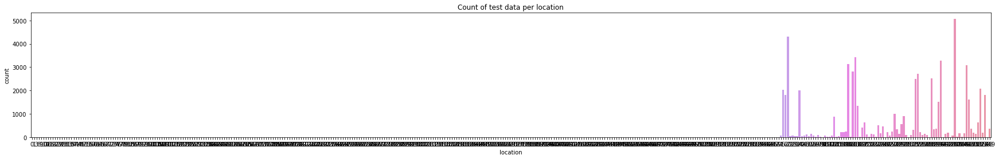

In [64]:
fig = plt.figure(figsize=(30, 4))
ax = sns.countplot(df_images_test['location'], order=labels_location)
ax.set(xlabel='location', ylabel='count')
plt.title('Count of test data per location')

Train data and test data seems be completelly taken in different locations.

Number of pictures are greatly differed by location.

# Sample Solution

I have created sample solution, although it is not very accurate. Check out this [notebook](https://www.kaggle.com/nayuts/efficientnet-with-undersampling). It requires GPU to be turned on. I separated in order to people who forks this notebook and do some trial and error don't waste GPU time without realizing it.

I haven't beaten kaggle_sample_all_zero_iwildcam_2021.csv yet, but I will publish the idea.

1. First we crop the image based on the bbox detected by MegaDetector.
2. In the training data, the correct answer labels are given as annotations, so we can use them to train the model.
3. Classify the cropped images of the test data with the trained model.

4. We choose the animal species and their counts of the image with the highest count among the images in the same image burst.
![img](https://raw.githubusercontent.com/tasotasoso/kaggle_media/main/iwildcam2021/model_image.png)

## How can we improve accuracy?
We also check how empty the training data and test data are. We will also check how empty the training and test data is, because when we submit the results of our inference, we will fount that "kaggle_sample_all_zero_iwildcam_2021.csv" is very powerful. This should be because much of the testdata is mostly empty. From the detection results using MegaDetector, we can see roughly how much of the image is empty. Let's take a look.



In [65]:
def is_in_test(x):
    if os.path.exists(TEST_DATA_PATH + x + ".jpg"):
        return True
    else:
        return False
    
are_images_in_test = [ is_in_test(x) for x in megadetector_results_df["id"]]
are_images_in_train = [not is_in_test for is_in_test in are_images_in_test]

train_megadetector_results_df =  megadetector_results_df[are_images_in_train]
test_megadetector_results_df =  megadetector_results_df[are_images_in_test]

Text(0.5, 1.0, 'Distribution of number of detection by MegaDetector for train data.')

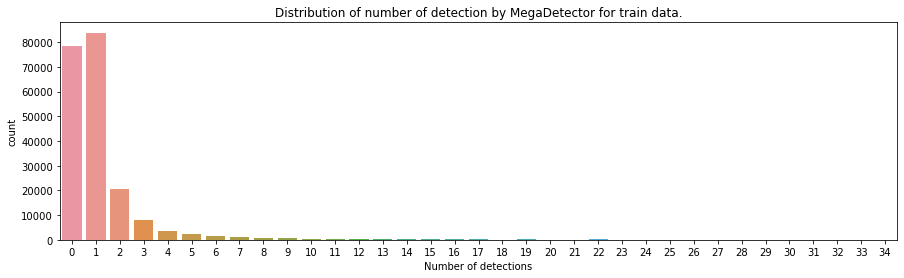

In [66]:
fig = plt.figure(figsize=(15, 4))
ax = sns.countplot([len(detection) for detection in train_megadetector_results_df["detections"]])
ax.set(xlabel='Number of detections', ylabel='count')
plt.title('Distribution of number of detection by MegaDetector for train data.')

Text(0.5, 1.0, 'Distribution of number of detection by MegaDetector for test data.')

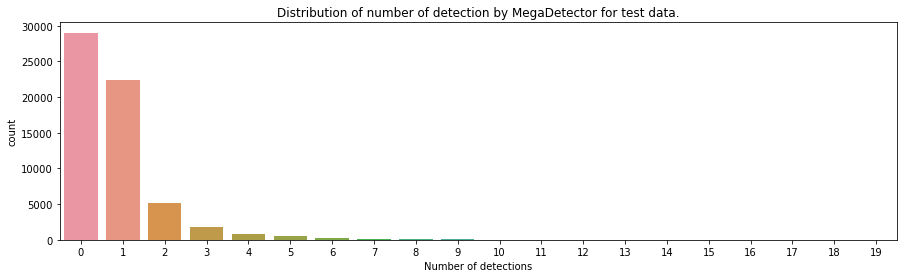

In [67]:
fig = plt.figure(figsize=(15, 4))
ax = sns.countplot([len(detection) for detection in test_megadetector_results_df["detections"]])
ax.set(xlabel='Number of detections', ylabel='count')
plt.title('Distribution of number of detection by MegaDetector for test data.')

In [68]:
We can see that the training data is nearly half empty, but the test data is almost half empty. In other words, in order to improve accuracy, it is better to submit all columns as zero as soon as possible if t can be determined to be empty with certainty.

SyntaxError: invalid syntax (<ipython-input-68-2eb9f64f7578>, line 1)